In [74]:
import pyvinecopulib as pv
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as scs
from Ratio import *
from tqdm import tqdm
from statsmodels.distributions.empirical_distribution import ECDF as fit_ecdf
from scipy.special import logsumexp

def emp_cdf(v, u):
    """ evaluate the empirical copula at points v using the samples u"""
    # cdf is evaluated at points v, v has to be a MxD vector in [0,1]^D, cdf is evaluated at these points
    # u are samples from model NxD vector in [0,1]^D, u should be very large
    # larger u will lead to better estimation of the empirical copula but slows down computation
    cdf_vals = np.empty(shape=(len(v)))
    for i in range(v.shape[0]):
        cdf_vals[i] = np.sum(np.all(u<=v[[i],:], axis=1))
    return cdf_vals/len(u)

In [57]:
def sample(cop_name, nsamples, params):
    if cop_name == "gaussian":
        corrMatrix = params["corrMatrix"]
        copula = pv.Bicop(family=pv.BicopFamily.gaussian, parameters=corrMatrix)
    elif cop_name == "student":
        corrMatrix = params["corrMatrix"]
        nu = params["nu"]
        copula = pv.Bicop(family=pv.BicopFamily.student, parameters=[corrMatrix, nu])
    elif cop_name == "clayton":
        theta = params["theta"]
        copula = pv.Bicop(family=pv.BicopFamily.clayton, parameters=theta)
    elif cop_name == "gumbel":
        theta = params["theta"]
        copula = pv.Bicop(family=pv.BicopFamily.gumbel, parameters=theta)
    elif cop_name == "mixture":
        combination = params["combination"]
        copulas = [pv.Bicop(family=pv.BicopFamily[comp["type"]], parameters=comp["theta"]) for comp in combination]
        weights = [comp["weight"] for comp in combination]
        copula = pv.MixtureBicop(copulas, weights)
    else:
        raise ValueError(f"Unknown copula type: {cop_name}")
    
    return copula.simulate(nsamples)

def log_likelihood(cop_name, u1, u2, params):
    if cop_name == "gaussian":
        corrMatrix = params["corrMatrix"]
        copula = pv.Bicop(family=pv.BicopFamily.gaussian, parameters=corrMatrix)
    elif cop_name == "student":
        corrMatrix = params["corrMatrix"]
        nu = params["nu"]
        copula = pv.Bicop(family=pv.BicopFamily.student, parameters=[corrMatrix, nu])
    elif cop_name == "clayton":
        theta = params["theta"]
        copula = pv.Bicop(family=pv.BicopFamily.clayton, parameters=theta)
    elif cop_name == "gumbel":
        theta = params["theta"]
        copula = pv.Bicop(family=pv.BicopFamily.gumbel, parameters=theta)
    else:
        raise ValueError(f"Unknown copula type: {cop_name}")
    
    data = np.column_stack((u1, u2))
    return copula.loglik(data)

# Example usage:
params_gaussian = {"corrMatrix": [0.1]}
samples = sample("gaussian", 500, params_gaussian)
u1, u2 = samples[:, 0], samples[:, 1]
log_likelihood_value = log_likelihood("gaussian", u1, u2, params_gaussian)
print(log_likelihood_value)

-0.32268842896154903


In [60]:
N_TRAIN = 1000
N_TEST = 5000
N_ROUNDS = 25
np.random.seed(990109)

sims_runs_all = []
log_likelihoods_runs_all = []

for round in tqdm(range(N_ROUNDS)):
    # Generate data

    # Student-t
    corrMatrix = np.random.uniform(0.5,0.95)
    nu = np.random.uniform(2,10)

    params_student = {"corrMatrix": corrMatrix, "nu": nu}
    samples_student = sample("student", N_TRAIN + N_TEST, params_student)
    u1_student, u2_student = samples_student[:, 0], samples_student[:, 1]
    log_likelihood_student = log_likelihood("student", u1_student[N_TRAIN:], u2_student[N_TRAIN:], params_student)

    # Clayton
    theta = 2
    params_clayton = {"theta": [theta]}
    samples_clayton = sample("clayton", N_TRAIN + N_TEST, params_clayton)
    u1_clayton, u2_clayton = samples_clayton[:, 0], samples_clayton[:, 1]
    log_likelihood_clayton = log_likelihood("clayton", u1_clayton[N_TRAIN:], u2_clayton[N_TRAIN:], params_clayton)

    # Gumbel
    theta = 2
    params_gumbel = {"theta": [theta]}
    samples_gumbel = sample("gumbel", N_TRAIN + N_TEST, params_gumbel)
    u1_gumbel, u2_gumbel = samples_gumbel[:, 0], samples_gumbel[:, 1]
    log_likelihood_gumbel = log_likelihood("gumbel", u1_gumbel[N_TRAIN:], u2_gumbel[N_TRAIN:], params_gumbel)

    # Mixture of 2 gaussians (using scipy.stats: first mixture on gaussian z-space, then transform to copula u-space)
    '''
    # My mixture 
    means = [[np.random.uniform(-5, 5), np.random.uniform(-5, 5)]for _ in range(2)]
    covs = [np.random.uniform(-0.95, 0.95), np.random.uniform(-0.95, 0.95)]
    multipliers = [np.random.uniform(0.8,1.2), np.random.uniform(0.8,1.2)]
    z = np.concatenate(
        [scs.multivariate_normal.rvs(
        mean=means[i], cov=multipliers[i]*np.array([[1,covs[i]],[covs[i],1]]
        ), size=int((N_TRAIN + N_TEST)/2)) for i in range(2)])
    u_1_mix = 0.5*(scs.norm(loc=means[0][0], scale=multipliers[0]).cdf(z[:,0]) + scs.norm(loc=means[1][0], scale=multipliers[1]).cdf(z[:,0]))
    u_2_mix = 0.5*(scs.norm(loc=means[0][1], scale=multipliers[0]).cdf(z[:,1]) + scs.norm(loc=means[1][1], scale=multipliers[1]).cdf(z[:,1]))
    u_1_mix = u_1_mix[np.random.permutation(N_TRAIN + N_TEST)]
    u_2_mix = u_2_mix[np.random.permutation(N_TRAIN + N_TEST)]
    log_likelihood_top = scs.multivariate_normal.logpdf(z[N_TRAIN:], mean=means[0], cov=multipliers[0]*np.array([[1,covs[0]],[covs[0],1]])).sum() + scs.multivariate_normal.logpdf(z[N_TRAIN:], mean=means[1], cov=multipliers[1]*np.array([[1,covs[1]],[covs[1],1]]).sum()) 
    log_likelihood_bottom = '''
    # ----------------------------- IGC mixture -----------------------------
    mu_1 = np.random.uniform(-5,5,2)
    sigma_1 = (np.eye(2)+np.eye(2)[[1,0],:]*np.random.uniform(-0.95,0.95,1))*np.random.uniform(0.8,1.2)
    
    mu_2 = np.random.uniform(-5,5,2)
    sigma_2 = (np.eye(2)+np.eye(2)[[1,0],:]*np.random.uniform(-0.95,0.95,1))*np.random.uniform(0.8,1.2)

    x1 = np.random.multivariate_normal(mean=mu_1, cov=sigma_1, size=N_TRAIN+N_TEST)
    x2 = np.random.multivariate_normal(mean=mu_2, cov=sigma_2, size=N_TRAIN+N_TEST)

    X = np.vstack([x1,x2])
    np.random.shuffle(X)
    cdf_1 = fit_ecdf(X[:,0])
    cdf_2 = fit_ecdf(X[:,1])
    U = np.column_stack((cdf_1(X[:,0]), cdf_2(X[:,1])))
    
    X_train = np.vstack([np.random.multivariate_normal(mean=mu_1, cov=sigma_1, size=N_TRAIN),
                         np.random.multivariate_normal(mean=mu_2, cov=sigma_2, size=N_TRAIN)])
    np.random.shuffle(X_train)
    U_train = np.column_stack([cdf_1(X_train[:,0]), cdf_2(X_train[:,1])])

    X_test = np.vstack([np.random.multivariate_normal(mean=mu_1, cov=sigma_1, size=N_TEST),
                        np.random.multivariate_normal(mean=mu_2, cov=sigma_2, size=N_TEST)])
    np.random.shuffle(X_test)
    U_test = np.column_stack([cdf_1(X_test[:,0]), cdf_2(X_test[:,1])])
    
    u_1_mix = np.concatenate([U_train[:,0], U_test[:,0]])
    u_2_mix = np.concatenate([U_train[:,1], U_test[:,1]])  
    # ----------------------------- IGC mixture -----------------------------



    # append to list
    sims_runs_all.append([[u1_student, u2_student], [u1_clayton, u2_clayton], [u1_gumbel, u2_gumbel],[ u_1_mix, u_2_mix]])
    log_likelihoods_runs_all.append([log_likelihood_student, log_likelihood_clayton, log_likelihood_gumbel, _])

100%|██████████| 25/25 [00:01<00:00, 19.04it/s]


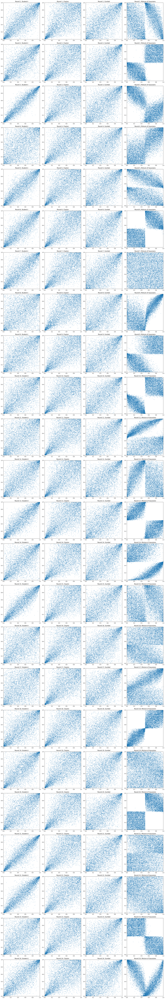

In [61]:
import matplotlib.pyplot as plt

# Assuming sims_runs_all is already populated with the samples

fig, axes = plt.subplots(24, 4, figsize=(20, 120))
axes = axes.flatten()

sample_types = ["Student-t", "Clayton", "Gumbel", "Mixture of Gaussians"]

for i in range(24):
    for j in range(4):
        ax = axes[i * 4 + j]
        u1, u2 = sims_runs_all[i][j]
        ax.scatter(u1, u2, s=1)
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
        ax.set_title(f'Round {i+1}, {sample_types[j]}')

plt.tight_layout()
plt.show()

In [72]:
ratios = []

for r,run in tqdm(enumerate(sims_runs_all)):
    # run = [u1_student, u2_student], [u1_clayton, u2_clayton], [u1_gumbel, u2_gumbel],[ u_1_mix, u_2_mix]
    for u,u1_u2 in enumerate(run):
        # u1_u2 = [u1, u2]
        z1,z2 = scs.norm.ppf(u1_u2[0][:N_TRAIN]),scs.norm.ppf(u1_u2[1][:N_TRAIN])
        p_data = np.column_stack((z1,z2))
        p_data = np.nan_to_num(p_data, nan=0, posinf=0, neginf=0)
        q_data = np.random.randn(50000,2)
        # Fit Ratio copula
        ratio = Ratio(h_dim=100, in_dim=2, h_layers=2)
        optimizer = torch.optim.Adam(ratio.parameters())

        for epoch in (range(500)):
            optimizer.zero_grad()
            r_p = ratio(torch.tensor(p_data).float())
            r_q = ratio(torch.tensor(np.random.randn(1000,2)).float())
            #loss = (-(r_p /(1+r_p)).log() - (1/(1+r_q)).log() ).mean()
            loss = loss_nce(r_p, r_q, p_data.shape[0], q_data.shape[0])
            loss.backward()
            optimizer.step()
            if epoch % 100 == 0:
                with torch.no_grad():
                    #check if loss is not a number
                    if torch.isnan(loss):
                        print(r,u,'NAN!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')
                    #print(f'Epoch {epoch}, loss {loss.item()}')
        print('run',r,'cop_u',u,'DONE')
        ratios.append(ratio)


0it [00:00, ?it/s]

run 0 unif 0 DONE
run 0 unif 1 DONE
run 0 unif 2 DONE


1it [00:09,  9.44s/it]

run 0 unif 3 DONE
run 1 unif 0 DONE
run 1 unif 1 DONE
run 1 unif 2 DONE


2it [00:18,  9.28s/it]

run 1 unif 3 DONE
run 2 unif 0 DONE
run 2 unif 1 DONE
run 2 unif 2 DONE


3it [00:27,  9.30s/it]

run 2 unif 3 DONE
run 3 unif 0 DONE
run 3 unif 1 DONE
run 3 unif 2 DONE


4it [00:36,  9.16s/it]

run 3 unif 3 DONE
run 4 unif 0 DONE
run 4 unif 1 DONE
run 4 unif 2 DONE


5it [00:45,  9.01s/it]

run 4 unif 3 DONE
run 5 unif 0 DONE
run 5 unif 1 DONE
run 5 unif 2 DONE


6it [00:54,  8.92s/it]

run 5 unif 3 DONE
run 6 unif 0 DONE
run 6 unif 1 DONE
run 6 unif 2 DONE


7it [01:03,  8.86s/it]

run 6 unif 3 DONE
run 7 unif 0 DONE
run 7 unif 1 DONE
run 7 unif 2 DONE


8it [01:11,  8.82s/it]

run 7 unif 3 DONE
run 8 unif 0 DONE
run 8 unif 1 DONE
run 8 unif 2 DONE


9it [01:20,  8.82s/it]

run 8 unif 3 DONE
run 9 unif 0 DONE
run 9 unif 1 DONE
run 9 unif 2 DONE


10it [01:29,  8.82s/it]

run 9 unif 3 DONE
run 10 unif 0 DONE
run 10 unif 1 DONE
run 10 unif 2 DONE


11it [01:38,  8.83s/it]

run 10 unif 3 DONE
run 11 unif 0 DONE
run 11 unif 1 DONE
run 11 unif 2 DONE


12it [01:47,  8.82s/it]

run 11 unif 3 DONE
run 12 unif 0 DONE
run 12 unif 1 DONE
run 12 unif 2 DONE


13it [01:55,  8.82s/it]

run 12 unif 3 DONE
run 13 unif 0 DONE
run 13 unif 1 DONE
run 13 unif 2 DONE


14it [02:05,  8.90s/it]

run 13 unif 3 DONE
run 14 unif 0 DONE
run 14 unif 1 DONE
run 14 unif 2 DONE


15it [02:13,  8.88s/it]

run 14 unif 3 DONE
run 15 unif 0 DONE
run 15 unif 1 DONE
run 15 unif 2 DONE


16it [02:22,  8.84s/it]

run 15 unif 3 DONE
run 16 unif 0 DONE
run 16 unif 1 DONE
run 16 unif 2 DONE


17it [02:31,  8.82s/it]

run 16 unif 3 DONE
run 17 unif 0 DONE
run 17 unif 1 DONE
run 17 unif 2 DONE


18it [02:40,  8.80s/it]

run 17 unif 3 DONE
run 18 unif 0 DONE
run 18 unif 1 DONE
run 18 unif 2 DONE


19it [02:49,  8.83s/it]

run 18 unif 3 DONE
run 19 unif 0 DONE
run 19 unif 1 DONE
run 19 unif 2 DONE


20it [02:57,  8.83s/it]

run 19 unif 3 DONE
run 20 unif 0 DONE
run 20 unif 1 DONE
run 20 unif 2 DONE


21it [03:06,  8.83s/it]

run 20 unif 3 DONE
run 21 unif 0 DONE
run 21 unif 1 DONE
run 21 unif 2 DONE


22it [03:15,  8.84s/it]

run 21 unif 3 DONE
run 22 unif 0 DONE
run 22 unif 1 DONE
run 22 unif 2 DONE


23it [03:24,  8.81s/it]

run 22 unif 3 DONE
run 23 unif 0 DONE
run 23 unif 1 DONE
run 23 unif 2 DONE


24it [03:33,  8.79s/it]

run 23 unif 3 DONE
run 24 unif 0 DONE
run 24 unif 1 DONE
run 24 unif 2 DONE


25it [03:41,  8.87s/it]

run 24 unif 3 DONE


In [91]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import scipy.stats
from tqdm import tqdm
from scipy.special import logsumexp

def sample_ratio(ratio, n):
    '''
    Sample from the ratio copula with Sampling Importance Resampling.
    '''
    z = np.random.randn(n, 2)
    r_log = np.log(ratio(torch.tensor(z).float()).detach().numpy())
    sims = np.random.choice(np.arange(n), size=n, p=np.exp(r_log - logsumexp(r_log)).flatten(), replace=True)
    return scipy.stats.norm.cdf(z[sims])

fig, axes = plt.subplots(75, 4, figsize=(20, 375))
axes = axes.flatten()

sample_types = ["Student-t", "Clayton", "Gumbel", "Mixture of Gaussians"]

# Plot the true samples, the ratio models, and the sampled points
for i in range(25):
    for j in range(4):
        # Plot the true samples
        ax_true = axes[i * 12 + j]
        u1, u2 = sims_runs_all[i][j]
        ax_true.scatter(u1, u2, s=1)
        ax_true.set_xlim(0, 1)
        ax_true.set_ylim(0, 1)
        ax_true.set_title(f'Round {i+1}, {sample_types[j]}')

        # Plot the ratio models
        ax_ratio = axes[i * 12 + 4 + j]
        
        # Create a grid for plotting
        x, y = np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))
        z = torchS.tensor(np.column_stack((x.flatten(), y.flatten())))
        gauss = scipy.stats.norm.pdf(x) * scipy.stats.norm.pdf(y)

        # Get the ratio
        r = ratios[i * 4 + j](z.float()).detach().numpy()
        Z = r.reshape(100, 100) #* gauss
        ax_ratio.contourf(scipy.stats.norm.cdf(x), scipy.stats.norm.cdf(y), Z, levels=30)
        ax_ratio.set_xlim(0, 1)
        ax_ratio.set_ylim(0, 1)
        ax_ratio.set_title(f'Ratio Model {i+1}, {sample_types[j]}')

        # Plot the sampled points
        ax_sampled = axes[i * 12 + 8 + j]
        samples_test = sample_ratio(ratios[i * 4 + j], 5000)
        ax_sampled.scatter(samples_test[:, 0], samples_test[:, 1], alpha=0.1)
        ax_sampled.set_xlim(0, 1)
        ax_sampled.set_ylim(0, 1)
        ax_sampled.set_title(f'Sampled Points {i+1}, {sample_types[j]}')

plt.tight_layout()
plt.show()

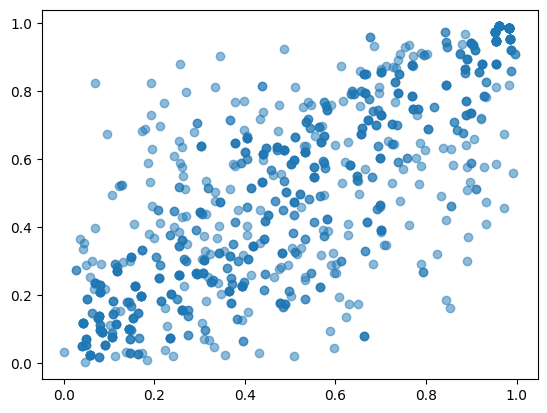

In [83]:
def sample_ratio(ratio, n): 
    '''
    Sample from the ratio copula with Sampling Importance Resampling.
    '''
    z = np.random.randn(n, 2)
    r_log = np.log(ratio(torch.tensor(z).float()).detach().numpy())
    sims = np.random.choice(np.arange(n), size=n, p=np.exp(r_log - logsumexp(r_log)).flatten(),replace=True)
    return scs.norm.cdf(z[sims])

# Sample from the ratio models
samples_test = sample_ratio(ratios[0],1000)
plt.scatter(samples_test[:,0],samples_test[:,1],alpha=0.5)